The objective of this notebook is to utilize BERTopic to analyze player reviews of Honkai Impact: Star Rail and extract insights. This analysis using BERTopic yields results distinct from other topic modeling techniques, such as LDA, NMF, and Top2Vec.

For positive reviews (Topic 1), all models reach a similar conclusion, highlighting the game's strong character and environment design. However, for negative reviews (Topic 0), BERTopic uncovers additional insights: some players have requested the inclusion of a controller system, allowing gameplay with controllers. Notably, positive reviews significantly outnumber negative ones, leading to some negative feedback, identified by the other models, being grouped under positive topics in BERTopic's analysis.

## Import Libraries

In [1]:
import torch

In [2]:
import pandas as pd
import nltk
import gensim
from gensim.utils import simple_preprocess
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from bertopic import BERTopic

C:\Users\42128\miniconda3\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Read Dataframe

In [3]:
df = pd.read_csv("Honkai-Star-Rail-modeling.csv")

In [4]:
documents = df["snippet"]
documents  = list(documents)

## Text Preprocessing

In [5]:
# get stopwords from nltk
stopword_voca = set(stopwords.words('english'))

# tokenized docs by gensim
tokenized_docs = [simple_preprocess(doc) for doc in documents]

In [6]:
# remove stopwords
filtered_docs = []
for words in tokenized_docs:
    filtered_words = []
    
    for word in words:
        if word not in stopword_voca:
            filtered_words.append(word)
            
    filtered_docs.append(filtered_words)

In [7]:
# lemmatization
wl = WordNetLemmatizer()
lemm_docs = []

for words in filtered_docs:
    lemm_words = []
    for word in words:
        lemm_words.append(wl.lemmatize(word))
    lemm_docs.append(lemm_words)

In [8]:
# Join words
preprocessed_docs = [" ".join(doc) for doc in lemm_docs]

## Topic Modeling

### Embeddings

In [9]:
from sentence_transformers import SentenceTransformer

# Pre-calculate embeddings
embedding_model = SentenceTransformer("BAAI/bge-small-en")
embeddings = embedding_model.encode(preprocessed_docs, show_progress_bar=True)

Batches: 100%|███████████████████████████████████████████████████████████████████████| 622/622 [04:28<00:00,  2.31it/s]


### Sub-models

In [10]:
from umap import UMAP
from hdbscan import HDBSCAN

umap_model = UMAP(n_neighbors = 15,
                  n_components = 5,
                  min_dist = 0.0,
                  metric = "cosine",
                  random_state=42)

hdbscan_model = HDBSCAN(
    min_cluster_size = 150,
    metric = "euclidean",
    cluster_selection_method = "eom",
    prediction_data = True)

In [11]:
# Pre-reduce embeddings for visualization purposes
reduced_embeddings = UMAP(n_neighbors=15,
                          n_components=2,
                          min_dist=0.0,
                          metric='cosine',
                          random_state=42).fit_transform(embeddings)

### Keyword Extraction methods

In [13]:
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance

# KeyBERT
keybert = KeyBERTInspired()

# MMR
mmr = MaximalMarginalRelevance(diversity = 0.3)

# All representation models
representation_model = {
    "keybert": keybert,
        "mmr": mmr
}

### Model

In [15]:
topic_model = BERTopic(
    # sub-models
    embedding_model = embedding_model,
    umap_model = umap_model,
    hdbscan_model = hdbscan_model,
    representation_model = representation_model,

    # Hyperparameters
    top_n_words = 10,
    verbose = True
)

topics, probs = topic_model.fit_transform(preprocessed_docs, embeddings)

2024-09-23 16:27:15,056 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-09-23 16:28:00,601 - BERTopic - Dimensionality - Completed ✓
2024-09-23 16:28:00,610 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-09-23 16:28:04,230 - BERTopic - Cluster - Completed ✓
2024-09-23 16:28:04,251 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-09-23 16:28:06,950 - BERTopic - Representation - Completed ✓


In [16]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,keybert,mmr,Representative_Docs
0,-1,46,-1_never_could_genshin_pilled,"[never, could, genshin, pilled, meow, goddahyu...","[genshin, never, could, goddahyumm, game, giga...","[genshin, pilled, goddahyumm, tectone, gigacha...","[genshin could never, genshin could never, gen..."
1,0,19689,0_game_character_good_like,"[game, character, good, like, story, play, lov...","[game, gameplay, playing, play, played, fun, r...","[game, character, play, love, genshin, fun, st...","[like game, love game favorite time story fun ..."
2,1,165,1_controller_support_backbone_android,"[controller, support, backbone, android, add, ...","[controller, support, supported, gamepad, joys...","[controller, support, backbone, android, add, ...","[controller support, controller support, contr..."


In [38]:
reduced_outlieres_topics = topic_model.reduce_outliers(preprocessed_docs, topics=topics)

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 91.77it/s]


In [28]:
topic_model.get_topic(1, full=True)["keybert"]

[('controller', 0.948164),
 ('support', 0.91959774),
 ('supported', 0.9168176),
 ('gamepad', 0.9066906),
 ('joystick', 0.8817936),
 ('control', 0.87609243),
 ('controler', 0.87416565),
 ('gamesir', 0.87236655),
 ('xbox', 0.86640894),
 ('device', 0.86071384)]

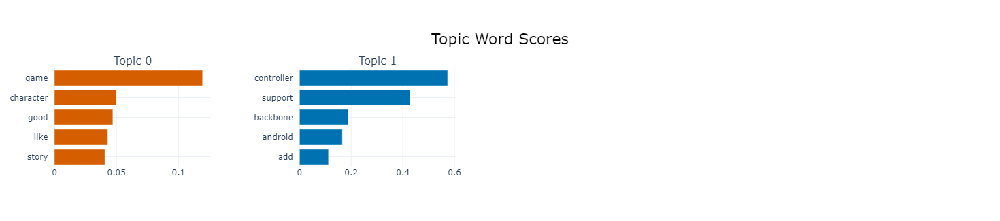

In [31]:
topic_model.visualize_barchart()

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 85.54it/s]


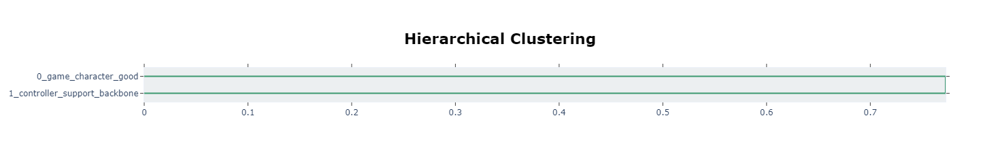

In [34]:
# Extract hierarchical topics and their representations
hierarchical_topics = topic_model.hierarchical_topics(preprocessed_docs)

# Visualize these representations
topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)

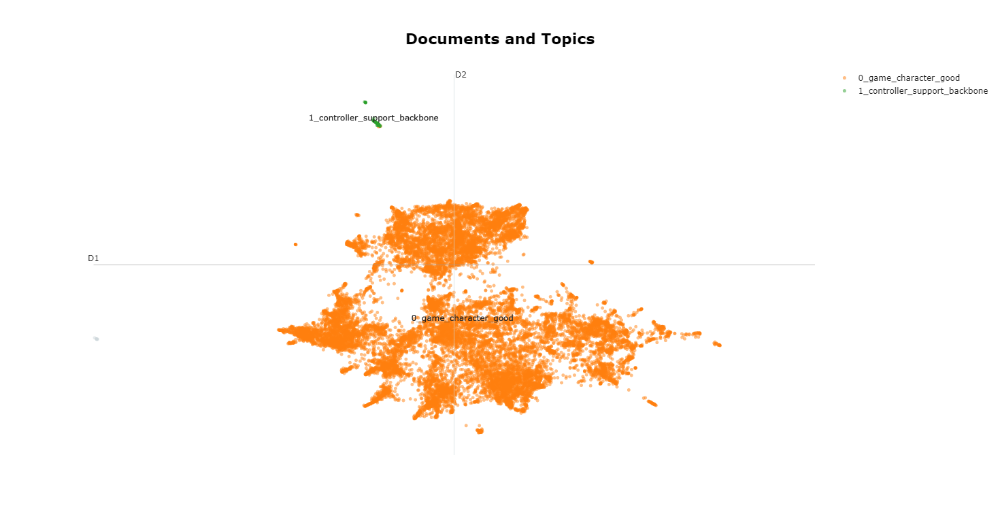

In [29]:
# doucments and topics relation
topic_model.visualize_documents(preprocessed_docs, 
                                reduced_embeddings = reduced_embeddings)

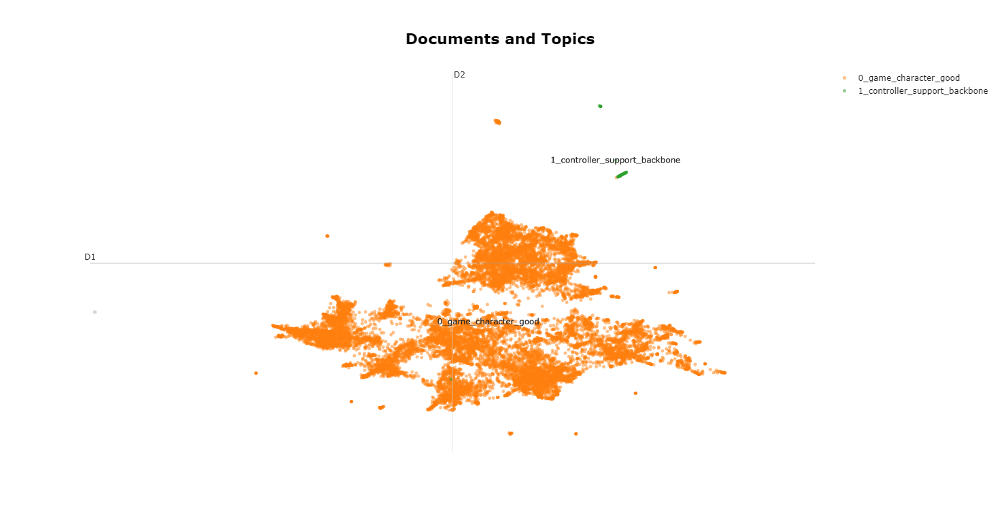

In [42]:
# reduced outliers doucments and topics relation
topic_model.visualize_documents(preprocessed_docs, topics=reduced_outlieres_topics)